<a href="https://colab.research.google.com/github/GauravisSerious/python/blob/main/Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import sys
from diffusers import DiffusionPipeline
import torch
import os
import datetime
from PIL import Image
import argparse

def initialize_pipeline():
    """
    Initializes the Stable Diffusion pipeline with pre-trained weights.
    Returns the pipeline ready for inference.
    """
    print("Initializing the Stable Diffusion pipeline...")
    pipe = DiffusionPipeline.from_pretrained(
        "stabilityai/stable-diffusion-xl-base-1.0",
        torch_dtype=torch.float16,
        use_safetensors=True,
        variant="fp16"
    )
    device = "cuda" if torch.cuda.is_available() else "cpu"
    pipe.to(device)
    print(f"Pipeline successfully loaded on device: {device.upper()}")
    return pipe, device

def generate_image(pipe, prompt, output_dir="generated_images", steps=30, guidance_scale=7.5):
    """
    Generates an image based on the provided prompt.
    """
    print(f"Generating image for prompt: '{prompt}'...")
    os.makedirs(output_dir, exist_ok=True)
    image = pipe(prompt, num_inference_steps=steps, guidance_scale=guidance_scale).images[0]
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    file_path = os.path.join(output_dir, f"generated_{timestamp}.png")
    image.save(file_path)
    print(f"Image saved to: {file_path}")
    return file_path

def main():
    """
    Main function to run the pipeline, handles Jupyter/Colab and CLI environments.
    """
    # Check if running in a Jupyter/Colab environment
    if "ipykernel_launcher" in sys.argv[0] or "colab" in sys.argv[0]:
        # If running in Jupyter/Colab, use hardcoded inputs
        prompt = input("Enter your text prompt: ")
        steps = int(input("Enter the number of steps (default 30): ") or 30)
        guidance_scale = float(input("Enter the guidance scale (default 7.5): ") or 7.5)
        output_dir = "generated_images"
    else:
        # Parse CLI arguments
        parser = argparse.ArgumentParser(description="Generate images using Stable Diffusion.")
        parser.add_argument("prompt", type=str, help="Text prompt to guide the image generation.")
        parser.add_argument("--steps", type=int, default=30, help="Number of inference steps (default: 30).")
        parser.add_argument("--guidance_scale", type=float, default=7.5, help="Guidance scale (default: 7.5).")
        parser.add_argument("--output_dir", type=str, default="generated_images", help="Directory to save generated images.")
        args = parser.parse_args()
        prompt = args.prompt
        steps = args.steps
        guidance_scale = args.guidance_scale
        output_dir = args.output_dir

    # Initialize the pipeline
    pipe, device = initialize_pipeline()

    # Generate the image
    file_path = generate_image(pipe, prompt, output_dir, steps, guidance_scale)

    # Display the generated image
    image = Image.open(file_path)
    image.show()

if __name__ == "__main__":
    main()


Enter your text prompt: A lady having a walk in jungle
Enter the number of steps (default 30): 50
Enter the guidance scale (default 7.5): 10
Initializing the Stable Diffusion pipeline...


Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Pipeline successfully loaded on device: CUDA
Generating image for prompt: 'A lady having a walk in jungle'...


  0%|          | 0/50 [00:00<?, ?it/s]

Image saved to: generated_images/generated_20250213_072806.png


In [ ]:
prompts = ["A fantasy forest", "A futuristic cityscape", "A serene beach at sunset"]

for prompt in prompts:
    file_path = generate_and_display_image(pipe, prompt, steps=50, guidance_scale=8.0)
    print(f"Displayed and saved: {file_path}")


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Pipeline initialized on device: CUDA
Generating image for prompt: 'A futuristic cityscape at sunset'...


  0%|          | 0/50 [00:00<?, ?it/s]

Image saved at: generated_images/generated_20250128_132503.png


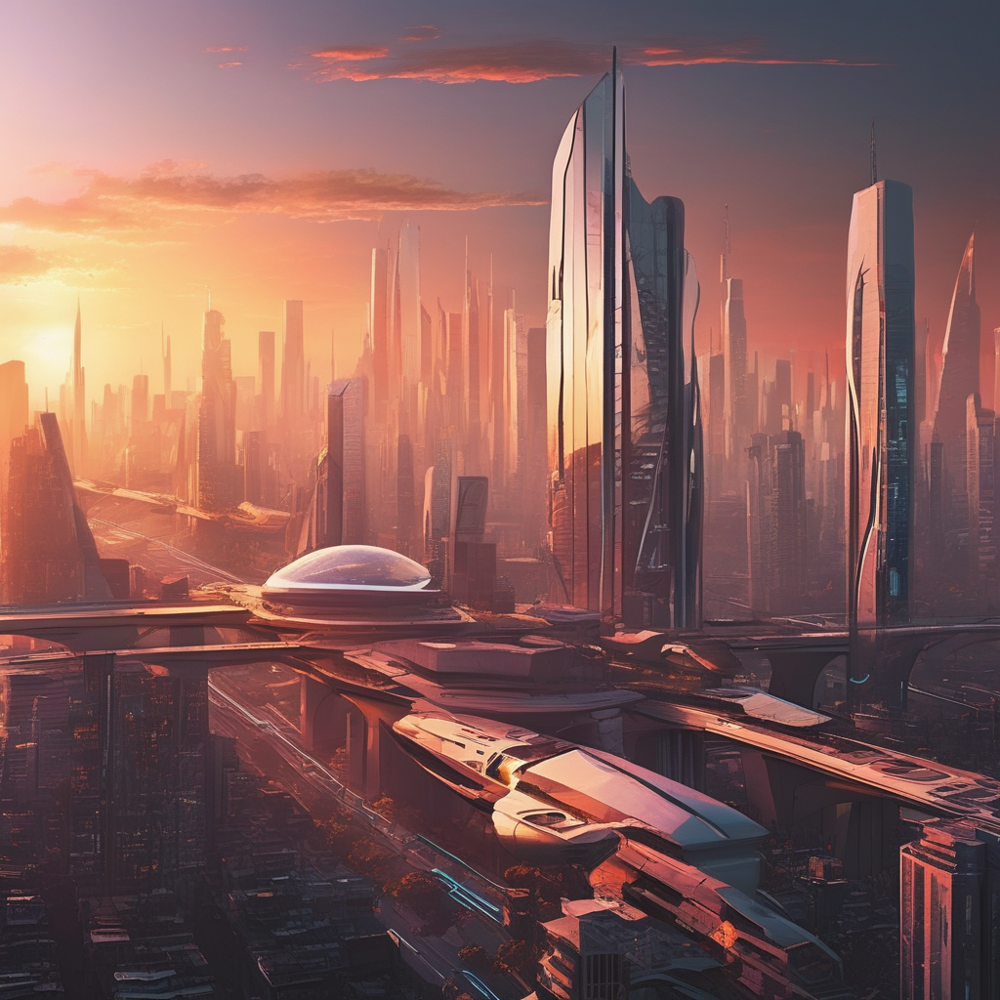

'generated_images/generated_20250128_132503.png'

In [ ]:
from diffusers import DiffusionPipeline
import torch
import os
import datetime
from PIL import Image
from IPython.display import display

# Initialize the pipeline
def initialize_pipeline():
    pipe = DiffusionPipeline.from_pretrained(
        "stabilityai/stable-diffusion-xl-base-1.0",
        torch_dtype=torch.float16,
        use_safetensors=True,
        variant="fp16"
    )
    device = "cuda" if torch.cuda.is_available() else "cpu"
    pipe.to(device)
    print(f"Pipeline initialized on device: {device.upper()}")
    return pipe

# Generate and display images in the notebook
def generate_and_display_image(pipe, prompt, steps=30, guidance_scale=7.5, output_dir="generated_images"):
    os.makedirs(output_dir, exist_ok=True)  # Ensure the output directory exists

    # Generate the image
    print(f"Generating image for prompt: '{prompt}'...")
    image = pipe(prompt, num_inference_steps=steps, guidance_scale=guidance_scale).images[0]

    # Save the generated image
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    file_path = os.path.join(output_dir, f"generated_{timestamp}.png")
    image.save(file_path)

    # Display the image directly in the notebook
    print(f"Image saved at: {file_path}")
    display(image)  # Display the PIL image in the notebook

    return file_path

# Example usage
pipe = initialize_pipeline()
prompt = "A futuristic cityscape at sunset"
generate_and_display_image(pipe, prompt, steps=50, guidance_scale=8.0)


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Pipeline initialized on device: CUDA
Generating image for prompt: 'A Potrait Of Narrenda Modi the President of India'...


  0%|          | 0/50 [00:00<?, ?it/s]

Image saved at: generated_images/generated_20250128_132734.png


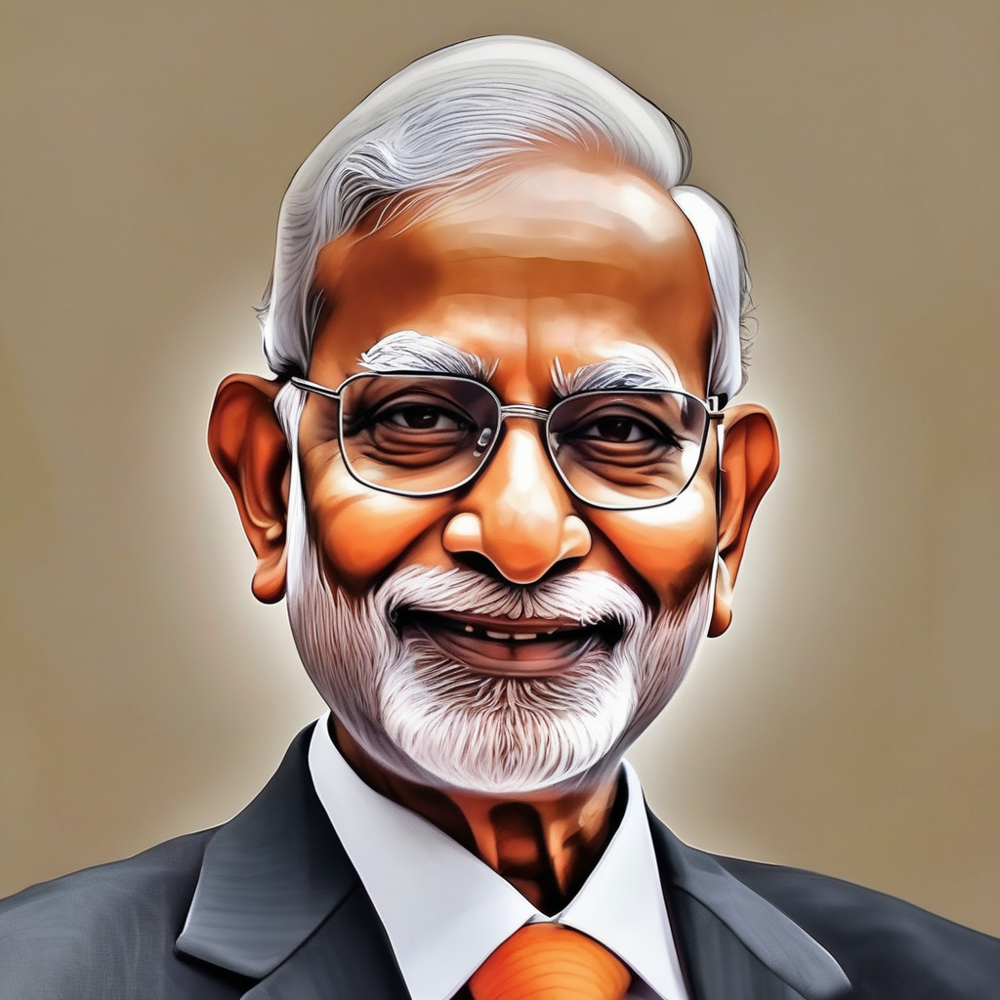

'generated_images/generated_20250128_132734.png'

In [ ]:

pipe = initialize_pipeline()
prompt = "A Potrait Of Narrenda Modi the President of India"
generate_and_display_image(pipe, prompt, steps=50, guidance_scale=8.0)


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

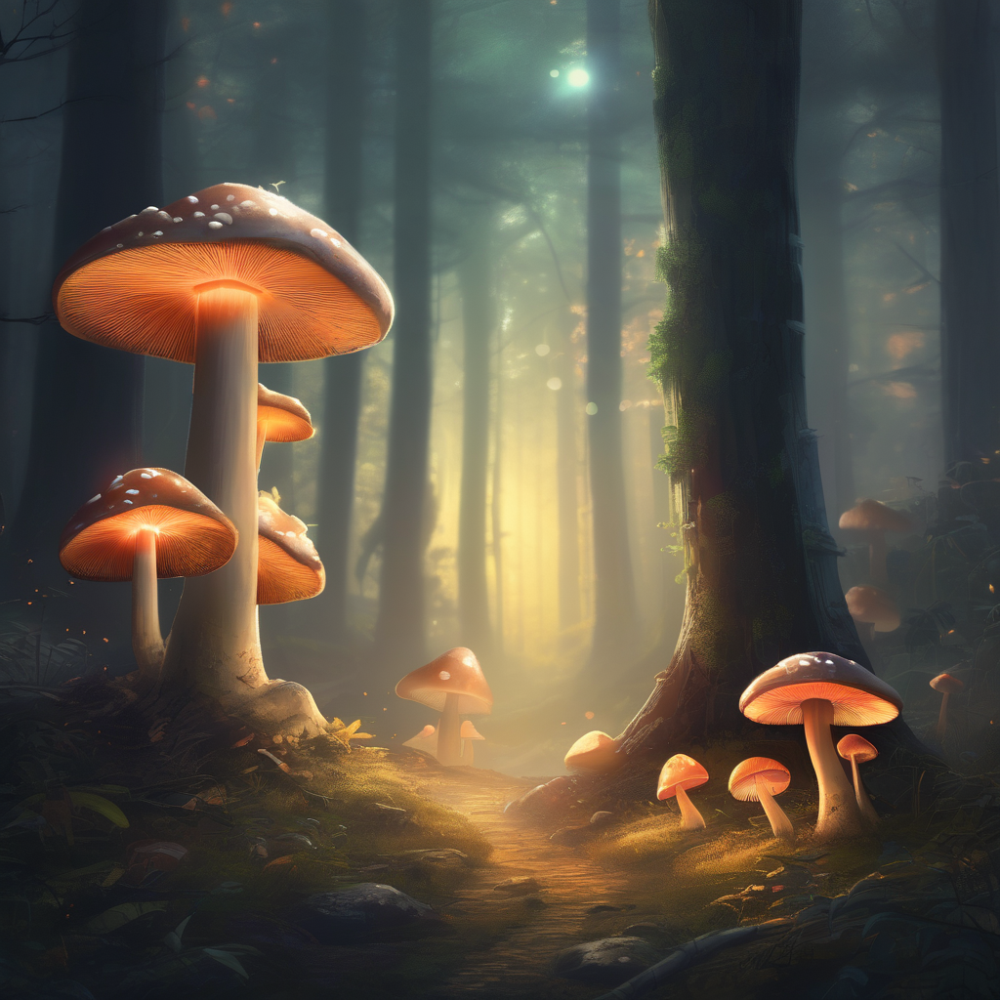

**Prompt Used:** A serene forest with glowing mushrooms

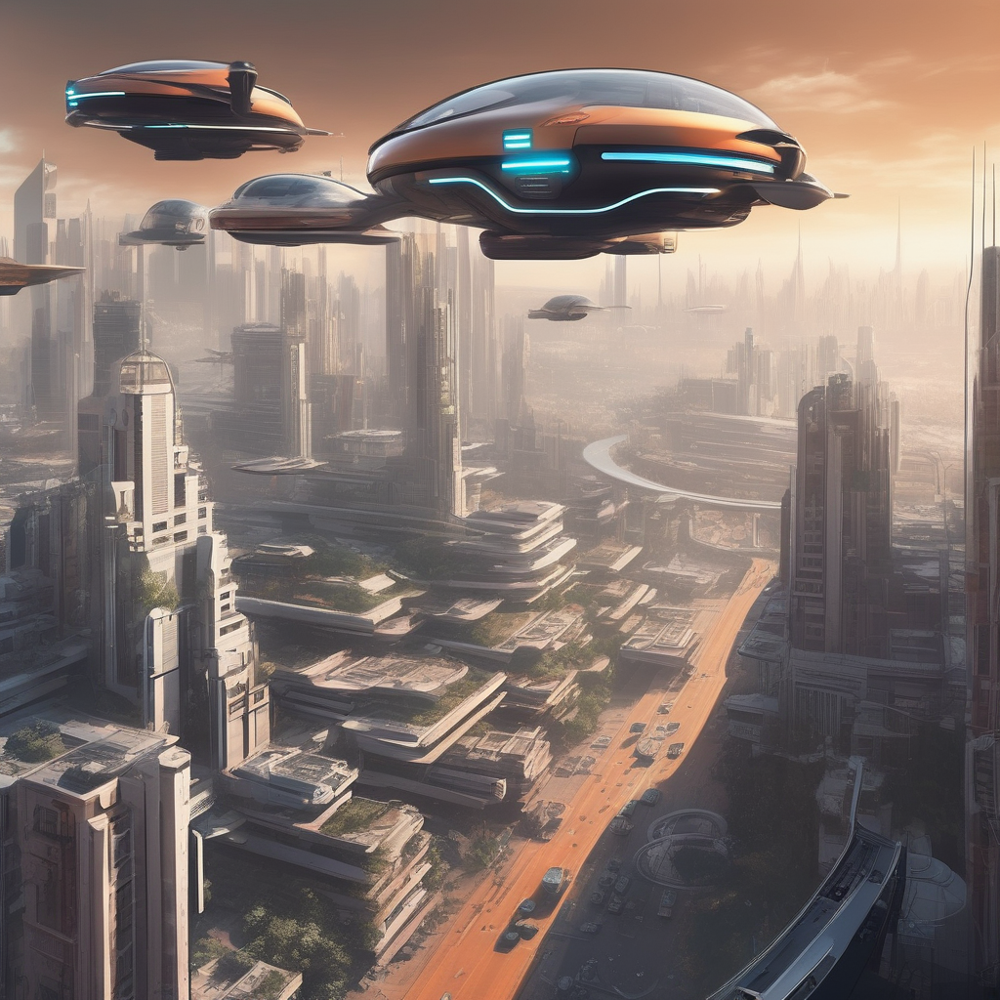

**Prompt Used:** A futuristic cityscape with flying cars

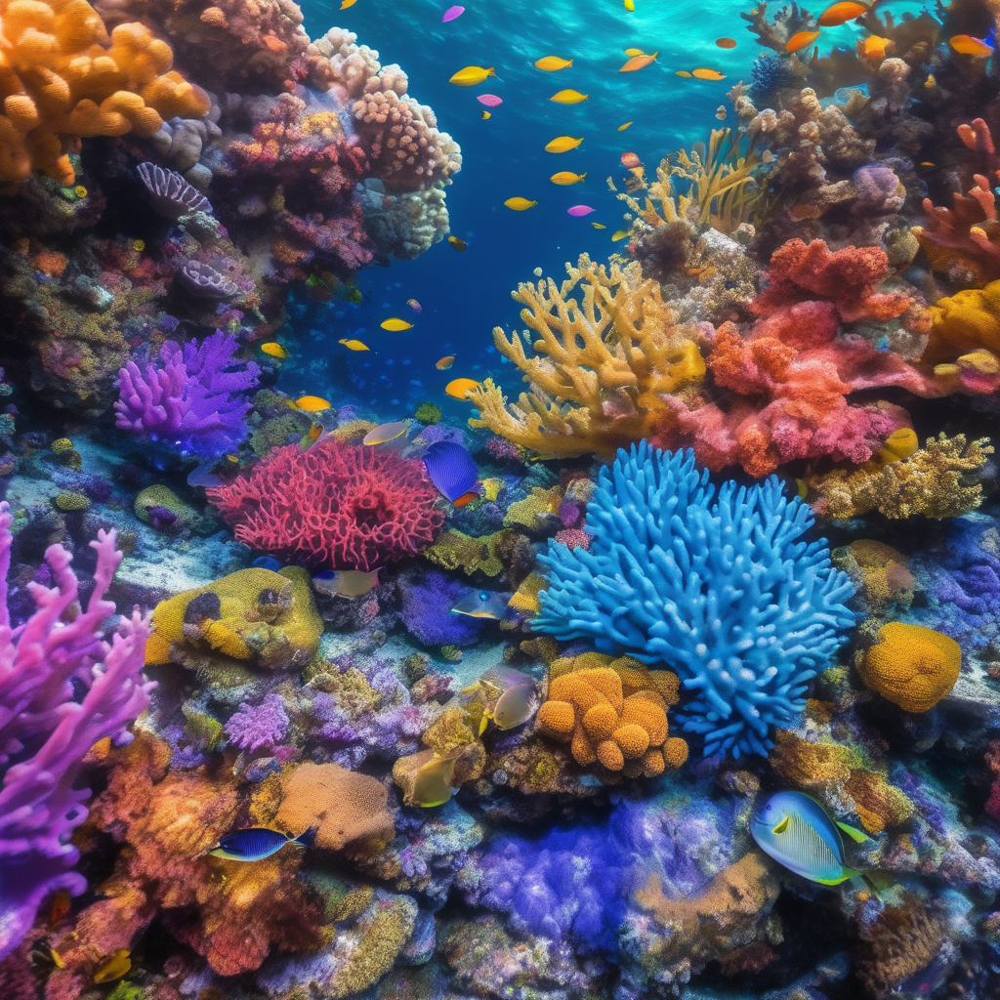

**Prompt Used:** An underwater coral reef with vibrant colors

In [ ]:
import os
import datetime
import logging
from PIL import Image, PngImagePlugin
from IPython.display import display, Markdown
from diffusers import DiffusionPipeline
import torch

# Configure logging
logging.basicConfig(
    format="%(asctime)s - %(levelname)s - %(message)s",
    level=logging.INFO
)

def initialize_pipeline(model_name="stabilityai/stable-diffusion-xl-base-1.0"):
    """
    Initializes the Stable Diffusion pipeline with the specified model.
    """
    logging.info(f"Loading model: {model_name}")
    pipe = DiffusionPipeline.from_pretrained(
        model_name,
        torch_dtype=torch.float16,
        use_safetensors=True,
        variant="fp16"
    )
    device = "cuda" if torch.cuda.is_available() else "cpu"
    pipe.to(device)
    logging.info(f"Pipeline loaded and moved to device: {device.upper()}")
    return pipe

def validate_inputs(prompt, steps, guidance_scale):
    """
    Validates user inputs to ensure they are reasonable.
    """
    if not prompt or not isinstance(prompt, str):
        raise ValueError("Prompt must be a non-empty string.")
    if not (10 <= steps <= 100):
        raise ValueError("Steps must be between 10 and 100.")
    if not (1.0 <= guidance_scale <= 15.0):
        raise ValueError("Guidance scale must be between 1.0 and 15.0.")

def save_image_with_metadata(image, file_path, prompt, steps, guidance_scale):
    """
    Saves the generated image with metadata embedded in the PNG file.
    """
    metadata = PngImagePlugin.PngInfo()
    metadata.add_text("Prompt", prompt)
    metadata.add_text("Steps", str(steps))
    metadata.add_text("Guidance Scale", str(guidance_scale))
    metadata.add_text("Generated By", "Stable Diffusion Pipeline")

    image.save(file_path, "PNG", pnginfo=metadata)
    logging.info(f"Image saved with metadata: {file_path}")

def generate_image(pipe, prompt, steps=30, guidance_scale=7.5, output_dir="generated_images"):
    """
    Generates an image using the Stable Diffusion pipeline.
    """
    validate_inputs(prompt, steps, guidance_scale)

    os.makedirs(output_dir, exist_ok=True)
    logging.info(f"Generating image for prompt: '{prompt}'...")

    image = pipe(prompt, num_inference_steps=steps, guidance_scale=guidance_scale).images[0]

    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    file_path = os.path.join(output_dir, f"generated_{timestamp}.png")

    save_image_with_metadata(image, file_path, prompt, steps, guidance_scale)
    return file_path

def display_image(file_path):
    """
    Displays a saved image in the notebook.
    """
    image = Image.open(file_path)
    display(image)
    display(Markdown(f"**Prompt Used:** {image.info.get('Prompt', 'N/A')}"))
    logging.info(f"Displayed image: {file_path}")

def display_image_gallery(image_paths):
    """
    Displays multiple images in a gallery format.
    """
    logging.info("Displaying image gallery...")
    for image_path in image_paths:
        display_image(image_path)

def main():
    """
    Main function for generating and displaying images.
    """
    model_name = "stabilityai/stable-diffusion-xl-base-1.0"
    pipe = initialize_pipeline(model_name)

    prompts = [
        "A serene forest with glowing mushrooms",
        "A futuristic cityscape with flying cars",
        "An underwater coral reef with vibrant colors"
    ]
    steps = 50
    guidance_scale = 7.5
    output_dir = "generated_images"

    image_paths = []

    for prompt in prompts:
        try:
            file_path = generate_image(pipe, prompt, steps, guidance_scale, output_dir)
            image_paths.append(file_path)
        except Exception as e:
            logging.error(f"Error generating image for prompt '{prompt}': {e}")

    # Display all generated images in a gallery
    display_image_gallery(image_paths)

if __name__ == "__main__":
    main()


In [ ]:
from pyngrok import ngrok

# Kill all existing tunnels
ngrok.kill()

# Wait a few seconds before starting a new one
import time
time.sleep(5)

# Now start the Streamlit app again
!streamlit run app4.py &>/dev/null &

# Start a fresh ngrok tunnel
public_url = ngrok.connect(addr="8501")  # Streamlit default port
print("Your Streamlit app is live at:", public_url)


Your Streamlit app is live at: NgrokTunnel: "https://4f00-35-204-121-175.ngrok-free.app" -> "http://localhost:8501"


In [ ]:
from pyngrok import ngrok
import time
import subprocess

# Kill all existing tunnels
ngrok.kill()

# Wait a few seconds before starting a new one
time.sleep(5)

# Ensure the Streamlit app is named correctly
streamlit_file = "app2.py"  # Change to the correct filename if needed

# Start the Streamlit app again using subprocess
subprocess.Popen(["streamlit", "run", '/content/app2.py'])

# Start a fresh ngrok tunnel
public_url = ngrok.connect(addr="8501")  # Streamlit default port
print("Your Streamlit app is live at:", public_url)



Your Streamlit app is live at: NgrokTunnel: "https://35c0-34-105-87-198.ngrok-free.app" -> "http://localhost:8501"


In [ ]:
!pip install pyngrok


In [ ]:
!ngrok config add-authtoken 2sNkrdzcHTyPwrqPxQAeqVBMlt9_6G2srZvJ7SURaASyNHZnT

Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml


In [ ]:
!pip install streamlit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 64.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 83.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 7.3 MB/s eta 0:00:00
